# PHYS 325 Scientific Computing -- Fall 2018

## 2.3 Data analysis

According to Wikipedia: Activity for getting *insight* from *data*

- collecting data (simulation, experiment)
- organizing data
- data cleaning (errors, correlations)
- exploratory analysis (forming hypotheses; do I need more data?)
- modeling, fitting, statistical analysis
- data visualization
- drawing conclusions

=> scientific method!

<img src="https://imgs.xkcd.com/comics/the_difference.png " alt="Scientific Approach" style="width: 400px;"/>

<div style="text-align: right">Source: <a href="https://xkcd.com/242/">xkcd</a></div>

References for this chapter:

*[Everything you wanted to know about Data Analysis and Fitting but were afraid to ask](https://arxiv.org/pdf/1210.3781.pdf)* by Peter Young

*"Numerical Recipes"*, chapters 3, 14 and 15

### 2.3.1 Interpolation

discrete data $\longrightarrow$ continuous function

Needed for:

- (multi-dimensional) plotting
- numerical differentiation and integration
- solving differential equations
- interpolation of numerically difficult functions
     - evaluate function on a fine grid before simulation start
     - when function is needed, use interpolation instead of expensive numerical function evaluation
     - very important for Monte Carlo simulations!

Interpolation **goes through all data points** and provides values inbetween

=> this is different from fitting!

**Kinds of interpolation**:

- polynomial

  $$f(x) = a_0 +a_1x +a_2x^2 +\ldots+a_nx^n$$

  always possible with arbitrary accuracy for continuous functions defined on a finite interval

- spline (piecewise polynomial)
- rational functions (Pade)

  $$f(x)=\frac{b_0 +b_1x +b_2x^2 +\ldots+b_mx^m}{a_0 +a_1x +a_2x^2 +\ldots+a_nx^n}$$
  
- can also use trigonometric functions (Fourier methods)

**Polynomial interpolation**

- For $n+1$ different points there exists **only one** interpolating polynomial of degree $n$
- Note that higher order polynomials are highly oscillating

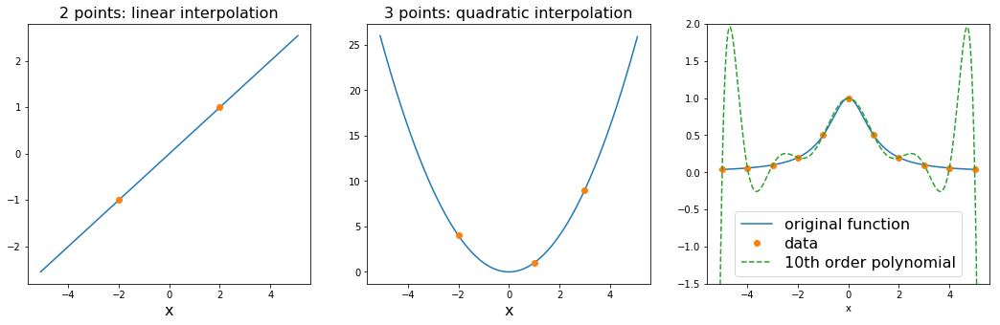

In [3]:
# this code generates the images below: example images for polynomial interpolation

%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt

def f(x):
    return 1/(1+x*x)

x = np.arange(-5.1, 5.1, 0.01)

fig = plt.figure(figsize=(18,5))
ax1 = fig.add_subplot(131)
ax2 = fig.add_subplot(132)
ax3 = fig.add_subplot(133)

ax1.plot(x, x/2)
ax1.plot([-2,2], [-1,1], 'o')
ax1.set_xlabel("x", fontsize=16)
ax1.set_title("2 points: linear interpolation", fontsize=16)

ax2.plot(x, x**2)
ax2.plot([-2,1,3], [4,1,9], 'o')
ax2.set_xlabel("x", fontsize=16)
ax2.set_title("3 points: quadratic interpolation", fontsize=16)

dataX = np.arange(-5.0, 6.0, 1)
dataY = f(dataX)
interpol = np.poly1d(np.polyfit(dataX, dataY, 10))

ax3.set_ylim(-1.5,2)
ax3.plot(x, f(x), label='original function')
ax3.plot(dataX, dataY, 'o', label='data')
ax3.plot(x, interpol(x), '--', label='10th order polynomial')
ax3.set_xlabel("x")
ax3.legend(loc='lower center', fontsize=16, labelspacing=0.3)

plt.show()

**Spline interpolation**

- splines are piecewise polynomial functions
- the pieces are "glued together" at the data points
- order $n$ spline: match function and derivatives up to incl. order $n-1$
- globally smooth up to $(n-1)$st derivative

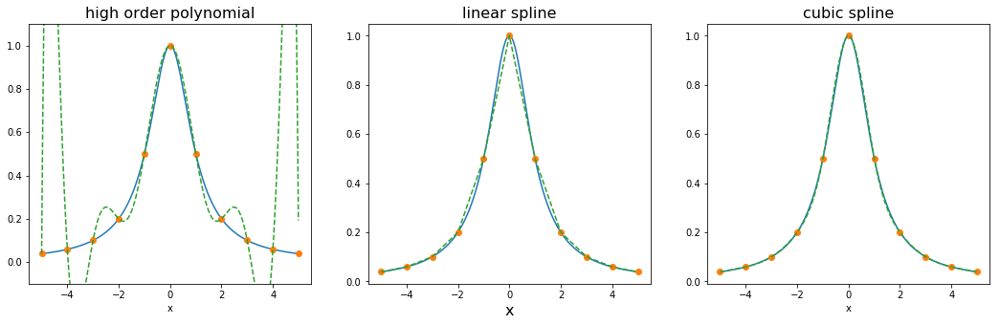

In [4]:
# this code generates the images below: comparison polynomial and spline interpolation

%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

def f(x):
    return 1/(1+x*x)

x = np.arange(-5.0, 5.0, 0.01)
dataX = np.arange(-5.0, 6.0, 1)
dataY = f(dataX)

fig = plt.figure(figsize=(18,5)) 
ax1 = fig.add_subplot(131)
ax2 = fig.add_subplot(132)
ax3 = fig.add_subplot(133)

spline_linear = interp1d(dataX, dataY, kind='linear')
spline_cubic = interp1d(dataX, dataY, kind='cubic')

ax1.set_ylim(-0.1,1.1)
ax1.plot(x, f(x))
ax1.plot(dataX, dataY, 'o')
ax1.plot(x, interpol(x), '--')
ax1.set_xlabel("x")
ax1.set_title("high order polynomial", fontsize=16)

ax2.plot(x, f(x))
ax2.plot(dataX, dataY, 'o')
ax2.plot(x, spline_linear(x), '--')
ax2.set_xlabel("x", fontsize=16)
ax2.set_title("linear spline", fontsize=16)

ax3.plot(x, f(x))
ax3.plot(dataX, dataY, 'o')
ax3.plot(x, spline_cubic(x), '--')
ax3.set_xlabel("x")
ax3.set_title("cubic spline", fontsize=16)

plt.show()

- better suited to interpolate over a large range
- often used in plotting programs
- most important case is the cubic spline (matching of function value, slope, curvature)

<br><br>

<img src="https://upload.wikimedia.org/wikipedia/commons/f/fd/Spline_%28PSF%29.png" alt="Wooden Spline" style="width: 300px;"/>

The "original" wooden spline used in the aircraft and shipbuilding industries. Image: <a href="https://en.wikipedia.org/wiki/Spline_(mathematics)#History">Wikipedia</a>

<br>

Construction of a cubic spline $S(x)$ on the interval $[a,b]$:

- original $n+1$ data points $(x_i,y_i)$ with $a=x_0<x_1<\ldots<x_n=b$
- on each subinterval $[x_{i-1}, x_i]$, the spline is a (different) polynomial of degree 3
- $S(x_i)=y_i$

$$ S(x)=\left\{{\begin{array}{rl}C_{1}(x),&x_{0}\leq x\leq x_{1}\\\cdots &\\C_{i}(x),&x_{i-1}<x\leq x_{i}\\\cdots &\\C_{n}(x),&x_{n-1}<x\leq x_{n}\end{array}}\right.$$

where each $C_{i}=a_{i}+b_{i}x+c_{i}x^{2}+d_{i}x^{3}(d_{i}\neq 0)$

Boundary conditions to determine the spline coefficients $a_i$, $b_i$, $c_i$, $d_i$ for all $i$:

- function values match: $C_i(x_{i-1})=y_{i-1}$ and $C_i(x_i)=y_i$ for $i=1,\ldots,n\ \ \ \; \Rightarrow 2n$ equations
- first derivatives match: $C'_i(x_i)=C'_{i+1}(x_i)$ for $i=1,\ldots,n-1\ \ \ \ \ \; \ \ \ \ \ \ \ \ \ \ \ \ \ \Rightarrow n-1$ equations
- second derivatives match: $C''_i(x_i)=C''_{i+1}(x_i)$ for $i=1,\ldots,n-1\ \ \; \ \ \ \ \ \ \ \ \ \ \Rightarrow n-1$ equations

In total: $4n-2$ equations for $4n$ spline coefficients

Add two additional conditions, for example:

- $C''_1(x_0)=C''_n(x_n)=0$: natural boundary conditions
- $C_1(x_0)=C_n(x_n)$ and $C'_1(x_0)=C'_n(x_n)$ and $C''_1(x_0)=C''_n(x_n)$: periodic boundary conditions

The resulting linear equations can be written in *matrix form* and solved with linear algebra routines

**Rational functions:**

- useful for functions with poles, where polynomial interpolation can give poor results
- often used as extrapolation tool
- computationally more expensive
- best known is the Pade approximation, defined as

$$R_{m,n}(x)=\frac{P_M(x)}{Q_N(x)}=\frac{p_0+p_1x+\ldots+p_Mx^M}{q_0+q_1x+\ldots+q_Nx^N}$$

At $x=0$ it reproduces the Taylor series up to order $M+N$.

Example:

$$\tan(x)=x+\frac{1}{3}x^3+\frac{2}{15}x^5+\ldots\ \ \ {\rm Taylor\ series\ at\ }x=0$$

To get, for instance, $R_{3,3}$ we need to solve

$$p_0+p_1x+p_2x^2+p_3x^3 = \left(q_0+q_1x+q_2x^2+q_3x^3\right)\left(x+\frac{1}{3}x^3+\frac{2}{15}x^5\right)$$

Solving for each power of $x$ separately we obtain

$$F_{3,3}(x)=\frac{x-\frac{1}{15}x^3}{1-\frac{2}{5}x^2}$$

**Multivariate interpolation**

- there are several methods in higher dimensions
- for regular grids:
     - nearest-neighbor interpolation,
     - bilinear and bicubic interpolation,
     - multivariate splines, etc.
- triangulation plays an important role
- irregular grids usually need to be somehow reduced to regular grids

### 2.3.2 Extrapolation

estimating the value of a variable beyond the observation range

![Extrapolation scientific example](images/extrapol_example_gh.png)

Example: Quadratic continuum extrapolation of data for the success probability in the "grasshopper problem" [Proc. R. Soc. A 473: 20170494](http://rspa.royalsocietypublishing.org/content/473/2207/20170494)

But be careful:

<img src="https://imgs.xkcd.com/comics/extrapolating.png" alt="Extrapolating" style="width: 400px;"/>

Source: [xkcd](https://xkcd.com/605/)

More serious example:

![Extrapolation scientific example](images/extrapol_example.png)

Linear continuum extrapolation of data for the critical temperature of the unitary Fermi gas. Red circles and red solid line are from [Phys. Rev. A 82, 053621 (2010)](https://journals.aps.org/pra/abstract/10.1103/PhysRevA.82.053621) and the blue triangles and dashed blue line are from [New J. Phys. 8 153 (2006)](http://iopscience.iop.org/article/10.1088/1367-2630/8/8/153/meta)

### 2.3.3 Statistical description of data

Descriptive statistics (model-independent) => characterize a data set in general terms: 

- mean,
- variance,
- correlation between data sets, etc.

$N$ data points: $x_1,\ldots,x_N$ 

=> *sample* of data; contains random noise (for now assume uncorrelated data points)

Underlying distribution $P(x)$ *which we don't know*!

Properties of the exact distribution:

- Normalization

  $$1 = \int_{-\infty}^\infty P(x) \, d x$$
  
- Moments:

  $$\langle x^n\rangle=\int_{-\infty}^\infty x^nP(x) \, d x$$
  
- From the moments we get:

  $$
  \begin{align}
  \mu &\equiv \langle x \rangle \\
  \sigma^2 &\equiv \langle \, \left(x - \langle x\rangle\right)^2 \,
  \rangle = \langle x^2 \rangle - \langle x \rangle^2\,
  \end{align}
  $$
  
  => mean and variance (which is the "standard deviation" squared)

We want to estimate the mean of the **exact distribution** from our **sampled data** and quantify our **uncertainty** of this estimate

- Sample mean

  $$\overline{x}=\frac{1}{N}\sum_{i=1}^Nx_i$$

     - estimates the value around which central clustering occurs
     - not always the best estimator => median

- Sample variance ("width" or "variability" around central value)

  $$
  s^2 =  {1 \over N-1} \sum_{i=1}^N \left( x_i -\overline{x}\right)^2 \, .
  $$

It is important to distinguish between the **exact distribution** and the **sampled distribution**!

As $N\rightarrow\infty$ the sampled distribution approaches the exact distribution.

<span style="color:yellow"><em>$\sigma$</em> is the standard deviation of the data or curve, and <em>s</em> is the standard deviation of the mean.</span>

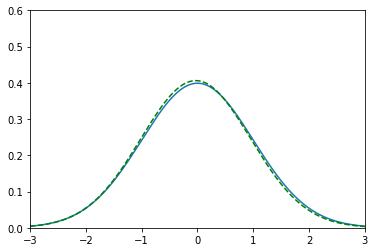

In [2]:
# this code generates the animation below

# the animation shows the following numerical "experiment":
# we generate random data points from a Gaussian distribution (solid line in plot)
# we use the data to estimate what this distribution is (pretending we don't know it)
# we do this by calculating the mean and standard deviation of the data
# we then plot a Gaussian distribution with the calculated parameters (dashed line)
# the more points we measure, the closer we approach the true distribution

%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# exact distribution, used to generate data
def gaussian(x, mu, sig):
    return np.exp(-(x - mu)*(x - mu)/(2*sig*sig))/np.sqrt(2*np.pi)/sig

mu_exact = 0
sig_exact = 1

randomdata = []

fig = plt.figure()
plt.xlim(-3, 3)
plt.ylim(0, 0.6)
plt.xlabel('x')

x = np.linspace(-3, 3, 1000)
plt.plot(x, gaussian(x, mu_exact, sig_exact))

def animate(i):
    
    global randomdata
    randomdata = np.append(randomdata, np.random.normal(mu_exact, sig_exact, 10))
    #randomdata = np.random.normal(mu_exact, sig_exact, 10)
    mean_data = np.mean(randomdata)
    sig_data = np.sqrt(np.var(randomdata))
    
    if i > 0:
        plt.cla()
        plt.xlim(-3, 3)
        plt.ylim(0, 0.6)
        plt.plot(x, gaussian(x, mu_exact, sig_exact))
        plt.plot(x, gaussian(x, mean_data, sig_data), 'g--')
    
simulation = animation.FuncAnimation(fig, animate, frames = 100, repeat = False)

from IPython.display import HTML
HTML(simulation.to_jshtml())

Thought experiment:

   - suppose we could repeat the set of $N$ measurements many many times
   - each time we get a value of the sample average $\overline{x}$. 
   - construct a distribution, $\widetilde{P}(\overline{x})$ from these
   - enough repetitions => effectively averaging over the exact distribution

   $$
   \langle \overline{x} \rangle = {1 \over N} \sum_{i=1}^N \langle x_i \rangle =
   \langle x \rangle  \equiv \mu \, ,
   $$

   $$
   \boxed{ \mbox{the best estimate of } \mu \mbox{ is }\overline{x}}
   $$

   An estimate like this, which gives the exact result if averaged over many repetitions of the experiment, is said to be **unbiased**.

   - Uncertainty, or "error bar" on our estimate $\overline{x}$ for the exact average $\mu$:

     $$
     \sigma_{\overline{x}}^2 \equiv \langle \overline{x}^2 \rangle- \langle \overline{x} \rangle^2 = {\sigma^2 \over N}\, ,
     $$

     The problem is that we don't know $\sigma^2$... but we do know $s^2$ !

     averaging $s^2$ over many repetitions of $N$ data points gives $\sigma^2$ => unbiased estimate

   - Standard error of the mean: 

    $$
    \boxed{\mbox{the best estimate of } \sigma_{\overline{x}}^2 \mbox{ is }{s^2  \over N}}
    $$

Altogether:

$$
\mu = \overline{x}\; \pm \; \sigma_{\overline{x}} \, ,
$$

where

$$
\sigma_{\overline{x}} = \left[
{1 \over N(N-1)} \, \sum_{i=1}^N (x_i -  \overline{x})^2 \right]^{1/2} \, .
$$

=> the error bar of the mean goes down like $1/\sqrt{N}$ for large $N$ !

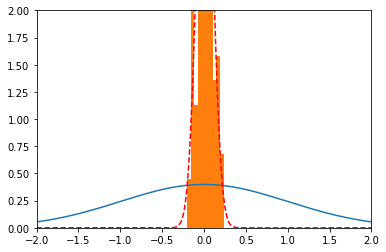

In [3]:
# this code generates the animation below

# as before, we generate points from a Gaussian distribution (blue solid line)
# now we are plotting the measured distribution of the *means*
# the orange blocks are the histogram of the means
# the red dashed line is a Gaussian fitted to the histogram

randomdata = []
distr_means = []
num_samples = 100

fig = plt.figure()
plt.xlim(-2, 2)
plt.ylim(0, 2)

x = np.linspace(-2, 2, 500)
plt.plot(x, gaussian(x, mu_exact, sig_exact))

def animate(i):
    
    global randomdata, distr_means
    randomdata = np.random.normal(mu_exact, sig_exact, num_samples)
    mean_data = np.mean(randomdata)
    sig_data = np.sqrt(np.var(randomdata))
    
    distr_means = np.append(distr_means, mean_data)
    
    if i > 0:
        plt.cla()
        plt.xlim(-2, 2)
        plt.ylim(0, 2)
        plt.plot(x, gaussian(x, mu_exact, sig_exact))
        if i > 10:
            plt.hist(distr_means, density = True)
            plt.plot(x, gaussian(x, np.mean(distr_means), sig_data/np.sqrt(num_samples)), 'r--')
            #plt.plot(x, gaussian(x, np.mean(distr_means), np.sqrt(np.var(distr_means))), 'g--')
    
simulation = animation.FuncAnimation(fig, animate, frames = 100, repeat = False)

from IPython.display import HTML
HTML(simulation.to_jshtml())

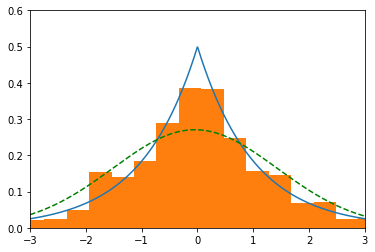

In [4]:
# this code generates the animation below

# now data is sampled from a distribution that is *not* Gaussian
# the sampled distribution is the Laplace distribution (blue solid line)
# the orange histogram shows the sampled data
# we also calculate the mean and standard deviation of the sampled data
# if we draw a Gaussian with these parameters we clearly see it doesn't match the data

%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# exact distribution, used to generate data
def laplace(x, mu, sig):
    return np.exp(-abs(x-mu)/sig)/(2.*sig)

mu_exact = 0
sig_exact = 1

randomdata = []

fig = plt.figure()
plt.xlim(-3, 3)
plt.ylim(0, 0.6)

x = np.linspace(-3, 3, 1000)
plt.plot(x, laplace(x, mu_exact, sig_exact))

def animate(i):
    
    global randomdata
    randomdata = np.append(randomdata, np.random.laplace(mu_exact, sig_exact, 10))
    #randomdata = np.random.normal(mu_exact, sig_exact, 10)
    mean_data = np.mean(randomdata)
    sig_data = np.sqrt(np.var(randomdata))
    
    if i > 0:
        plt.cla()
        plt.xlim(-3, 3)
        plt.ylim(0, 0.6)
        plt.plot(x, laplace(x, mu_exact, sig_exact))
        plt.plot(x, gaussian(x, mean_data, sig_data), 'g--')
        plt.hist(randomdata, bins = (i + 100)//5, density = True)
    
simulation = animation.FuncAnimation(fig, animate, frames = 100, repeat = False)

from IPython.display import HTML
HTML(simulation.to_jshtml())

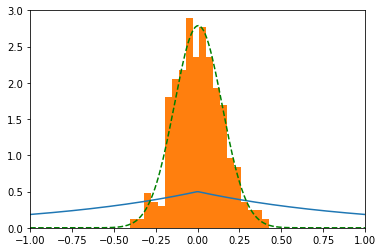

In [5]:
# this code generates the animation below

# as before, we sample data from the Laplace distribution
# but now we are plotting the distribution of the means
# although the data itself is not Gaussian, 
# the distribution of the means is always Gaussian!

randomdata = []
distr_means = []
num_samples = 100

fig = plt.figure()
plt.xlim(-1, 1)
plt.ylim(0, 3)

x = np.linspace(-1, 1, 200)
plt.plot(x, laplace(x, mu_exact, sig_exact))

def animate(i):
    
    global randomdata, distr_means
    randomdata = np.random.laplace(mu_exact, sig_exact, num_samples)
    mean_data = np.mean(randomdata)
    sig_data = np.sqrt(np.var(randomdata))
    
    distr_means = np.append(distr_means, mean_data)
    
    if i > 0:
        plt.cla()
        plt.xlim(-1, 1)
        plt.ylim(0, 3)
        plt.plot(x, laplace(x, mu_exact, sig_exact))
        if i > 10:
            plt.hist(distr_means, bins = 20, density = True)
            plt.plot(x, gaussian(x, np.mean(distr_means), np.sqrt(np.var(distr_means))), 'g--')
    
simulation = animation.FuncAnimation(fig, animate, frames = 400, repeat = False)

from IPython.display import HTML
HTML(simulation.to_jshtml())

What does this error bar mean in terms of probabilities?

Central limit theorem for large $N$: the distribution of $\overline{x}$ is a Gaussian. 

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/8/8c/Standard_deviation_diagram.svg/640px-Standard_deviation_diagram.svg.png" alt="Gaussian" style="width: 400px;"/>
Image: Wikipedia

In reality: outliers are much more common!

**Several random variables**

**sample covariance** of $x$ and $y$ defined as

$$
s_{xy}^2 \equiv  {1 \over N-1 } \sum_{i=1}^N
\left( x_i - \overline{x}\right) \, \left(y_i - \overline{y}\right)\, .
$$

Closely related to **correlation**

linear correlation coefficient (also called Pearson's $r$):

$$r = \frac{\sum_{i=1}^N
\left( x_i - \overline{x}\right) \, \left(y_i - \overline{y}\right)}{\sqrt{\sum_{i=1}^N
\left( x_i - \overline{x}\right)^2} \, \sqrt{\sum_{i=1}^N\left(y_i - \overline{y}\right)^2}}$$

- $r$ lies between -1 and 1
- $r=1$: complete positive correlation
- $r=-1$: complete negative correlation
- $r=0$: uncorrelated data
- value of $r$ often used to characterize the strength of (significant) correlations

**Correlation $\neq$ causation**

<img src="https://imgs.xkcd.com/comics/correlation.png" alt="Correlation" style="width: 400px;"/>

<div style="text-align: right">Source: <a href="https://xkcd.com/552/">xkcd</a></div>

- correlation: knowing the value of one variable gives information about the likely value of the other
- causation: one state influences the other via a cause-and-effect process

<center><b> Are Two Distributions Different?</b>
    <br>
or
<br>
<b> Are two data sets drawn from the same distribution function, or from different distribution functions?</b>
<br>
or
<br>
<b> Can we disprove, to a certain required level of significance, the null hypothesis that two data sets are drawn from the same population distribution function?</b>
    <br>
</center>
    
- Disproving the null hypothesis shows that the data sets are from different distributions. 
- Failing to disprove the null hypothesis only shows that the data sets can be *consistent* with a single distribution function.
- One can never prove that two data sets come from a single distribution (no amount of data can distinguish between distributions which differ only very slightly)

Cases:

- continuous data / binned data
- comparing to known distribution / comparing to equally unknown data sets

Example questions:

- Are the visible stars distributed uniformly in the sky? 
- Are educational patterns the same in Brooklyn as in the Bronx? 
- Do two brands of fluorescent lights have the same distribution of burn-out times? 
- Is the incidence of chicken pox the same for first-born, second-born, third-born children, etc.?

The accepted test for differences between binned distributions is the chi-square test:

$$\chi^2 = \sum_i\frac{(N_i-n_i)^2}{n_i}$$

- $N_i$: number of observed values in bin $i$
- $n_i$: number of expected values in bin $i$

large values of $\chi^2$ indicate an unlikely null hypothesis

### 2.3.4 Data fitting

Model-dependent statistics: fitting a smooth function through data

- set of $N$ data points with error bars: $(x_i,y_i,\sigma_i)$
- choice of fitting function
     - linear
     - higher order polynomial
     - exponential or power law
     - more complicated function
- fitting function depends on $M$ fit parameters, e.g. polynomial coefficients

We want:

- "best fit", or best values of the fit parameters,
- error estimates on the fit parameters,
- and a measure of how good the fit is!

Bad fit => fit parameters and errors are meaningless!

#### Least squares <span style="color:yellow">THIS FUNCTION IS REALLY IMPORTANT</span>

Minimize

$$
\chi^2 = \sum_{i=1}^N \left( \, {y_i - f(x_i) \over \sigma_i } \, \right)^2,
$$

where $f(x)$ is the fitting function

Why do we minimize this expression?

- fitting function should closely resemble the data
- how can we quantify this?

> It is not meaningful to ask the question, "What is the probability that a particular set of fitted parameters is correct?" The reason is that there is no statistical universe of models from which the parameters are drawn. There is just one model, the correct one, and a statistical universe of data sets that are drawn from it!

<div style="text-align: right">Quote from: <i>"Numerical Recipes in C"</i></div>

=> Turn this question around:

> Given a particular set of parameters, what is the probability that this data set could have occurred?

- our data set should not be too improbable for the correct choice of fit parameters

  => calculate probability of data given some parameters
  
  => take this as the *likelihood* of the parameters given the data
  <br>
  
- this identification is based on our *intuition* not strict maths
- then: mathematical **maximum likelihood estimation**

Assumptions:

- each data point $y_i$ has a measurement error that is independently random...
- ...and distributed as a normal (Gaussian) distribution around the "true" model $y(x)$

- then the probability of the data set is the product of the probabilities of each point
- maximizing this probability is equivalent to minimizing

$$
\chi^2 = \sum_{i=1}^N \left( \, {y_i - f(x_i) \over \sigma_i } \, \right)^2
$$

- the function $f(x)$ can be anything we like

#### Which $\chi^2$ values are "good enough"?

Simple estimate:

- assume normally distributed measurement errors
- we want most data points to be about $1\sigma$ away from the true value
- this would mean that $\chi^2$ should be approximately $N$
- but the best fit parameters are not statistically independent (if we take enough parameters we can fit anything through our data)
  
- consider instead

  **degrees of freedom**: $\nu = N-M$
  <br>
  
- compute $\chi^2/\nu$
     - it should be close to 1
     - values between 0 and 2 indicate a good fit
     - values that are too high indicate a bad fit (inappropriate fit function, too few parameters, errors underestimated)
     - values too close to 0 indicate overfitting (too many parameters, errors overestimated)
- if the errors $\sigma_i$ are unknown: use $\sigma_i=1$ (in this case we *cannot assess the goodness of fit*)

More precise estimate:

- for linear models: around minimum we have $\chi^2$ distribution for $N-M$ degrees of freedom
- probability $Q = \Gamma_Q(\nu/2,\chi^2_{\rm min}/2)$ that the chi-square should exceed a particular value by chance
- $\Gamma_Q(s,x)$ is the [regularized upper incomplete gamma function](https://docs.scipy.org/doc/scipy/reference/generated/scipy.special.gammaincc.html)
- can work with this even for nonlinear models
- $Q$ should be reasonably close to 1
     - usually want values $Q\gtrsim 0.1$
     - might accept fits with $Q>0.001$
     - rejected fits often have really small $Q$, e.g. around $10^{-12}$
     - $Q$ values that are too close to 1 might indicate overfitting

**Fitting data to a straight line** (linear regression)

$$f(x) = a + bx$$

Example, data from O. Goulko and M. Wingate, <i>"Thermodynamics of balanced and slightly spin-imbalanced Fermi gases at unitarity"</i>, <a href="http://pra.aps.org/abstract/PRA/v82/i5/e053621">Phys. Rev. A 82, 053621 (2010)</a>, eprint <a href="http://arxiv.org/abs/1008.3348">arXiv:1008.3348</a>

(0.06, 0.2)

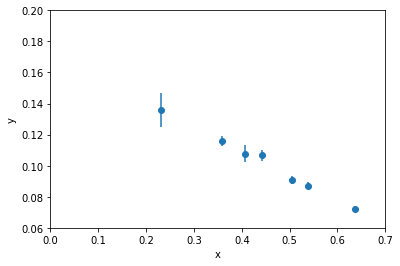

In [3]:
# plot of the data for the critical temperature vs discretization scale

%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import minimize

# legend: x, sigmax, y, sigmay
myData = np.array([[0.6359, 0.0028, 0.0724, 0.0016],
                   [0.5379, 0.0028, 0.0871, 0.0021],
                   [0.5055, 0.0032, 0.0907, 0.0026],
                   [0.4423, 0.0030, 0.1067, 0.0035],
                   [0.4066, 0.0051, 0.1078, 0.0052],
                   [0.3581, 0.0028, 0.1159, 0.0032],
                   [0.2319, 0.0058, 0.1358, 0.0110]])
x = myData[:,0]
y = myData[:,2]
sigmax = myData[:,1]
sigmay = myData[:,3]

plt.figure()
plt.errorbar(x, y, yerr=sigmay, fmt='o')
plt.xlabel("x")
plt.ylabel("y")
plt.xlim(0, 0.7)
plt.ylim(0.06, 0.2)

In [4]:
# linear least squares fit

def chisq(params):
    a, b = params
    return np.sum( (a + b*x - y)**2/sigmay**2 )

initial_guess = [0.16, -5]
minimize(chisq, initial_guess)

      fun: 2.0030757432000463
 hess_inv: array([[ 1.62381261e-05, -2.92082778e-05],
       [-2.92082778e-05,  5.42251081e-05]])
      jac: array([8.94069672e-08, 2.08616257e-07])
  message: 'Optimization terminated successfully.'
     nfev: 32
      nit: 5
     njev: 8
   status: 0
  success: True
        x: array([ 0.17291389, -0.15861776])

In [5]:
# goodness of fit measures

from scipy.special import gammaincc

dof = len(myData) - 2
chisq_min = minimize(chisq, initial_guess).fun

print("chisq_min/dof = ", chisq_min/dof)
print("Q = ", gammaincc(dof/2, chisq_min/2))

chisq_min/dof =  0.40061514864000924
Q =  0.848719284648489


(0.06, 0.2)

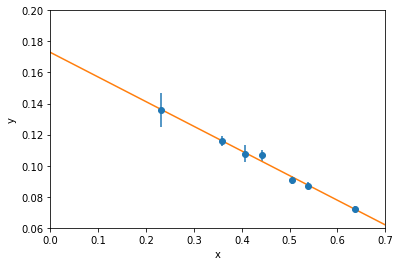

In [6]:
# plot of the data together with the fit

plt.figure()
plt.errorbar(x, y, yerr=sigmay, fmt='o')

best_fit = minimize(chisq, initial_guess).x
x_for_plot = np.linspace(0, 0.7, 100)
plt.plot(x_for_plot, best_fit[0] + best_fit[1]*x_for_plot)

plt.xlabel("x")
plt.ylabel("y")
plt.xlim(0, 0.7)
plt.ylim(0.06, 0.2)

We can also find the minimum **analytically** (by solving $\partial\chi^2/\partial a = \partial\chi^2/\partial b = 0$)

Define

$$
\begin{align}
S &\equiv& \sum_{i=1}^N\frac{1}{\sigma_i^2}\\
S_x &\equiv& \sum_{i=1}^N\frac{x_i}{\sigma_i^2}\\
S_y &\equiv& \sum_{i=1}^N\frac{y_i}{\sigma_i^2}\\
t_i &\equiv& \frac{1}{\sigma_i}\left(x_i-\frac{S_x}{S}\right)\\
S_{tt} &\equiv& \sum_{i=1}^N t_i^2
\end{align}
$$

Then

$$
\begin{align}
b &=& \frac{1}{S_{tt}}\sum_{i=1}^N\frac{t_iy_i}{\sigma_i}\\
a &=& \frac{S_y-S_xb}{S}
\end{align}
$$

(see "Numerical Recipes" for derivation)

In [110]:
# best fit using the analytical formulas

S = np.sum(1/sigmay/sigmay)
Sx = np.sum(x/sigmay/sigmay)
Sy = np.sum(y/sigmay/sigmay)
t = (x-Sx/S)/sigmay
Stt = np.sum(t*t)

b = np.sum(t*y/sigmay)/Stt
a = (Sy-Sx*b)/S
print('[ %.8f' % a, '%.8f' % b, ']')
print(best_fit)

[ 0.17291400 -0.15861795 ]
[ 0.17291389 -0.15861776]


Errors on the fit coefficients:

$$
\begin{align}
\sigma_a^2 &=& \frac{1}{S}\left(1+\frac{S_x^2}{SS_{tt}}\right)\\
\sigma_b^2 &=& \frac{1}{S_{tt}}
\end{align}
$$

(see "Numerical Recipes" for derivation)

In [111]:
error_on_a = np.sqrt((1+Sx*Sx/S/Stt)/S)
error_on_b = np.sqrt(1/Stt)

print("a = ", a, "+-", error_on_a, "\nb =", b, "+-", error_on_b)

a =  0.17291400480869254 +- 0.005698795029183341 
b = -0.15861794692190379 +- 0.010413945532988245


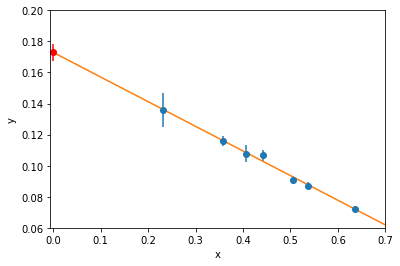

In [112]:
plt.errorbar(x, y, yerr=sigmay, fmt='o')
plt.errorbar(0, best_fit[0], yerr=error_on_a, fmt='ro')
plt.plot(x_for_plot, best_fit[0] + best_fit[1]*x_for_plot)

plt.xlabel("x")
plt.ylabel("y")
plt.xlim(-0.006, 0.7)
plt.ylim(0.06, 0.2)

plt.show()

In [120]:
# same as above using the numpy.polyfit routine

print(np.polyfit(x, y, 1, full=True, w=1/sigmay, cov=True),"\n")

fit_coeffs, fit_cov = np.polyfit(x, y, 1, full=False, w=1/sigmay, cov=True)

# unfortunately, the polyfit routine outputs the errors incorrectly
# to get the correct error bars we need to divide the covariance matrix fit_cov by χ2/(ν-2) ...

fit_cov = fit_cov/ (chisq_min/ (dof-2))

# part of the reason is explained in Appendix D of Peter Young's article
# if you are interested in the reason behind the additional -2, see for example here:
# https://stackoverflow.com/questions/51980910/scipy-curve-fit-vs-numpy-polyfit-different-covariance-matrices

print("Printing the polyfit fit result:")
# note that the order of the fit coefficients is also different!
print("\na = ", fit_coeffs[1], "+-", np.sqrt(fit_cov[1][1]),\
      "\nb =", fit_coeffs[0], "+-", np.sqrt(fit_cov[0][0]))

print("\nResults from the exact formula:")
print("\na = ", a, "+-", error_on_a, "\nb =", b, "+-", error_on_b)

(array([-0.15861795,  0.172914  ]), array([2.00307574]), 2, array([1.40866012, 0.12520645]), 1.5543122344752192e-15) 

Printing the polyfit fit result:

a =  0.17291400480869343 +- 0.005698795028625046 
b = -0.1586179469219054 +- 0.010413945531968017

Results from the exact formula:

a =  0.17291400480869254 +- 0.005698795029183341 
b = -0.15861794692190379 +- 0.010413945532988245


In [113]:
# same as above using the scipy.optimize.curve_fit routine
# this general routine works also for nonlinear fits, as we will see later

from scipy.optimize import curve_fit

# define function we want to fit to, in this case linear
def fit_func(x, a, b):
    return a + b*x

# in order to get correct error bars we need to set absolute_sigma=True !!!
popt, pcov = curve_fit(fit_func, x, y, sigma = sigmay, absolute_sigma=True)

print("\nBest fit parameters: ", popt)
print("Errors on fit parameters: ", np.sqrt(np.diag(pcov)))


Best fit parameters:  [ 0.172914   -0.15861795]
Errors on fit parameters:  [0.00569879 0.01041395]


**Data errors in both coordinates**

$$
\chi^2 = \sum_{i=1}^N {(y_i - a - bx_i)^2 \over \sigma_{y,i}^2 + b^2\sigma_{x,i}^2 }
$$

This is true because of the properties of the variance

$$ {\rm Var} (aX+bY+c)=a^{2}{\rm Var} (X)+b^{2}{\rm Var} (Y)+2ab\,{\rm Cov} (X,Y)$$

and hence

$${\rm Var}(y_i - a - bx_i) = {\rm Var}(y_i) + b^2{\rm Var}(x_i) = \sigma_{y,i}^2 + b^2\sigma_{x,i}^2$$

for independent errors

In [49]:
def chisq(params):
    a, b = params
    return np.sum( (a + b*x - y)**2/ (sigmay**2 + b*b*sigmax**2) )

initial_guess = [0.2, -1]
minimize(chisq, initial_guess)

      fun: 1.9512009993135009
 hess_inv: array([[ 1.68428055e-05, -3.03958590e-05],
       [-3.03958590e-05,  5.66377164e-05]])
      jac: array([-5.96046448e-08,  1.93715096e-07])
  message: 'Optimization terminated successfully.'
     nfev: 64
      nit: 12
     njev: 16
   status: 0
  success: True
        x: array([ 0.17298943, -0.15875628])

In [50]:
chisq_min_withxerrors = minimize(chisq, initial_guess).fun

print("chisq_min/dof = ", chisq_min_withxerrors/dof)
print("Q = ", gammaincc(dof/2, chisq_min_withxerrors/2))

chisq_min/dof =  0.3902401998627002
Q =  0.8558552840382943


(0.06, 0.2)

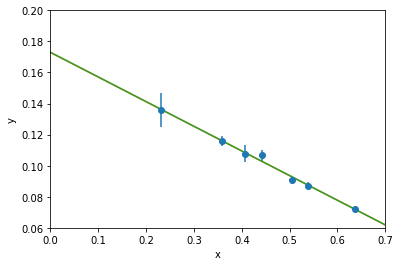

In [51]:
plt.figure()
plt.errorbar(x, y, xerr = sigmax, yerr = sigmay, fmt='o')

best_fit_withxerrors = minimize(chisq, initial_guess).x
plt.plot(x_for_plot, best_fit[0] + best_fit[1]*x_for_plot)
plt.plot(x_for_plot, best_fit_withxerrors[0] + best_fit_withxerrors[1]*x_for_plot)

plt.xlabel("x")
plt.ylabel("y")
plt.xlim(0, 0.7)
plt.ylim(0.06, 0.2)

- no longer an easy analytic solution for $a$ and $b$ (because $\partial\chi^2/\partial b=0$ is a nonlinear equation!)
- we can only exactly express $a$ as a function of $b$

$$a = \frac{\sum_{i=1}^N w_i(y_i-bx_i)}{\sum_{i=1}^N w_i}\ \ {\rm where }\ \ w_i=\frac{1}{\sigma_{y,i}^2 + b^2\sigma_{x,i}^2}$$

- need to minimize $\chi^2$ numerically, but can use formula above to simplify the function
- finding the standard errors on $a$ and $b$ is much more complicated:

<br>

![Fit errors](images/leastsqerrors.png)

<div style="text-align: right"> figure adapted from "Numerical Recipes" </div>

> A contour of constant $\Delta\chi^2$ as the boundary of a confidence region 

For normally distributed errors: 

This table shows the values of $\Delta\chi^2$ as function of confidence level $p$ and number of fit parameters $\nu$ on which we need an error estimate

$$
\begin{array}{|l|llllll|}
\hline
       &      &      & \nu  &      &      &     \\
p      & 1    & 2    & 3    & 4    & 5    & 6    \\       \hline
68.3\%  & 1.00 & 2.30 & 3.53 & 4.72 & 5.89 & 7.04 \\
90\%    & 2.71 & 4.61 & 6.25 & 7.78 & 9.24 & 10.6 \\
95.4\%  & 4.00 & 6.17 & 8.02 & 9.70 & 11.3 & 12.8 \\
99\%    & 6.63 & 9.21 & 11.3 & 13.3 & 15.1 & 16.8 \\
99.73\% & 9.00 & 11.8 & 14.2 & 16.3 & 18.2 & 20.1 \\
99.99\% & 15.1 & 18.4 & 21.1 & 23.5 & 25.7 & 27.8 \\ \hline
\end{array}
$$

Example:

> $\Delta\chi^2 = 1$ corresponds to the "standard" 68.3% confidence interval on *the intercept* for a linear fit

Strategy:

- find the best fit first, by using a minimization routine
- then map out the $\Delta\chi^2 = 1$ contour numerically
- this corresponds to solving a nonlinear equation
- we can use the geometric fact $\sigma_a^2 = r^2+s^2$, see picture:
     - first find point $B$ in the picture
     - for this we need the maximal value of $b$ so that $\Delta\chi^2 = \chi^2 - \chi^2_{\rm min} = 1$ (remember that we have a formula that gives us $a$ as a function of $b$)
     - this gives us $\sigma_b$ and the distance $s$ in the picture
     - then keep $b$ fixed (at its "best value") and vary $a$ until we reach $\Delta\chi^2 = \chi^2 - \chi^2_{\rm min} = 1$
     - this gives us the distance $r$ in the picture
     - we also have an exact formula for $r$:
     $$r^2 = \frac{1}{\sum_{i=1}^N w_i}$$
     - and we can get $\sigma_a$ with the geometric formula!

[ 0.17298943 -0.15875628]
True


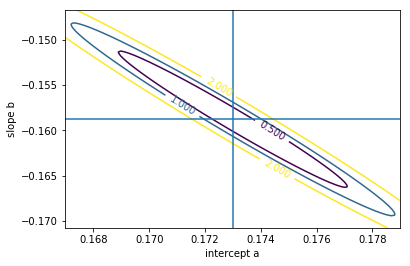

In [12]:
def chisq(params):
    a, b = params
    return np.sum( (a + b*x - y)**2/ (sigmay**2 + b*b*sigmax**2) )

def w(b):
    return 1/ (sigmay**2 + b*b*sigmax**2)

def a_exact(b):
    return np.sum(w(b)*(y-b*x))/np.sum(w(b))

def r_squared(b):
    return 1/np.sum(w(b))

# our best fit from before
print(best_fit_withxerrors)

# check exact formula for a
print(np.allclose(best_fit_withxerrors[0], a_exact(best_fit_withxerrors[1])))

# plot Δχ2 contours
delta_a = 0.006
delta_b = 0.012
a = np.arange(best_fit_withxerrors[0]-delta_a, best_fit_withxerrors[0]+delta_a, 0.0001)
b = np.arange(best_fit_withxerrors[1]-delta_b, best_fit_withxerrors[1]+delta_b, 0.0001)

delta_chisq = np.zeros((len(b), len(a)))
for i in range(len(a)):
    for j in range(len(b)):
        delta_chisq[j, i] = np.sum( (a[i] + b[j]*x - y)**2/(sigmay**2 + b[j]*b[j]*sigmax**2) ) - chisq_min_withxerrors

chi_contours = plt.contour(a, b, delta_chisq, levels = [0.5, 1, 2])
plt.clabel(chi_contours, inline=1, fontsize=10)
plt.axvline(x = best_fit_withxerrors[0])
plt.axhline(y = best_fit_withxerrors[1])
plt.xlabel("intercept a")
plt.ylabel("slope b")
plt.show()

sigma_b =  0.010680000000010681
sigma_b =  0.010413945532988245  (previously calculated: errors only in y-coordinates)
True
sigma_a =  0.005820135267778545
sigma_a =  0.005698795029183341  (previously calculated: errors only in y-coordinates)


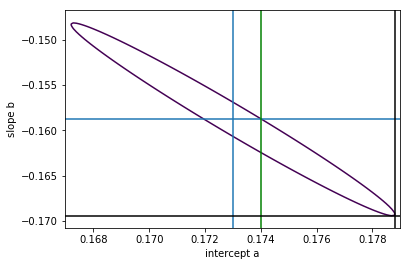

In [15]:
# find point B on the plot
current_chisq = chisq_min_withxerrors
current_b = best_fit_withxerrors[1]
while current_chisq < chisq_min_withxerrors + 1:
    current_b -= 0.00001      # I chose negative sign for the lower right corner, but plus sign works equally well
    current_params = a_exact(current_b), current_b
    current_chisq = chisq(current_params)

sigmab = current_b - best_fit_withxerrors[1]
print("sigma_b = ", abs(sigmab))
print("sigma_b = ", error_on_b, " (previously calculated: errors only in y-coordinates)")

# this automatically gives us the distance s
s = a_exact(current_b) - best_fit_withxerrors[0]

# find distance r on the plot explicitly
current_chisq = chisq_min_withxerrors
current_a = best_fit_withxerrors[0]
while current_chisq < chisq_min_withxerrors + 1:
    current_a += 0.0000001
    current_params = current_a, best_fit_withxerrors[1]
    current_chisq = chisq(current_params)

r = current_a - best_fit_withxerrors[0]

# compare with exact formula
print(np.isclose(r*r, r_squared(best_fit_withxerrors[1]), 1e-6))

# finally, get error on the intercept
print("sigma_a = ", np.sqrt(r*r + s*s))
print("sigma_a = ", error_on_a, " (previously calculated: errors only in y-coordinates)")

# plot in relation to Δχ2=1 contour
chi_contours = plt.contour(a, b, delta_chisq, levels = 1)
plt.axvline(x = best_fit_withxerrors[0])
plt.axhline(y = best_fit_withxerrors[1])

plt.axvline(x = r + best_fit_withxerrors[0], color = 'g')
plt.axvline(x = np.sqrt(r*r + s*s) + best_fit_withxerrors[0], color = 'k')
plt.axhline(y = sigmab + best_fit_withxerrors[1], color = 'k')

plt.xlabel("intercept a")
plt.ylabel("slope b")
plt.show()

#### Exponentials and power laws

Often nonlinear functions can be made linear, e.g.:

$$f(x) = a x^d \ \ \ {\rm with}\ \ {\rm constant }\ \ \ a, d$$

Take the logarithm of both sides of the equation:

$$\log(f) = \log(a) + d \log(x)$$

=> linear fit on a log-log scale

Similar: log-scale for exponentials

$$f(x) = a \exp(-bx)\Rightarrow\log(f) = \log(a) -bx$$

=> linear fit on a log scale

#### General linear least squares

In the same way as before, we can fit to a linear combination of *any* $M$ specified functions of $x$!

Most common: polynomials, in particular low order

$$y(x)=a_1+a_2x+a_3x^2\ldots+a_Mx^{M-1}$$

But the functions can also be more complicated, e.g.

$$y(x) = a_1\log(x) + a_2\sin(x)\cos(x) + a_3\exp(-x^2+15)+\ldots$$

General formula:

$$y(x)=\sum_{k=1}^Ma_kX_{k}(x)$$

where the (arbitrary) functions $X_k(x)$ are called **basis functions**

- the functions $X_k(x)$ **do not have to be linear**
- only the **combination** (dependence on the fit parameters) is linear

As before, minimize

$$
\chi^2=\sum_{i=1}^N\left(\frac{y_i-\sum_{k=1}^Ma_kX_{k}(x_i)}{\sigma_i}\right)^2
$$

Now we need to solve for many parameters: $a_1,\ldots,a_M$

=> but the dependence on the $a_k$ is linear

=> a linear expression in many parameters implies ...

<br><br><br>

... we have seen this before ...

<br><br><br>

... a system of linear equations! big matrices! linear algebra!

First we will write our $\chi^2$ in convenient **matrix notation**

$$A_{ij}=\frac{X_j(x_i)}{\sigma_i}$$

- the matrix $A$ is called the **design matrix** of the fitting problem
- remember that we know all $X_j(x_i)$ (the unknown fit parameters are not part of $X_j$)
- we need to have more data points than fit parameters: $N>M$ and hopefully $N\gg M$

=> the design matrix has more rows than columns

$$A=
\begin{pmatrix}
\frac{X_1(x_1)}{\sigma_1} & \ldots & \frac{X_M(x_1)}{\sigma_1} \\
\frac{X_1(x_2)}{\sigma_2} & \ldots & \frac{X_M(x_2)}{\sigma_2} \\
\vdots & & \vdots\\
\vdots & & \vdots\\
\vdots & & \vdots\\
\frac{X_1(x_N)}{\sigma_N} & \ldots & \frac{X_M(x_N)}{\sigma_N}
\end{pmatrix}
$$

Also define vector $\mathbf{b}$ of length $N$,

$$
b_i = \frac{y_i}{\sigma_i}
$$

and vector $\mathbf{a}$ of length $M$ containing the unknown fit parameters $a_1,\ldots,a_M$.

$$
\chi^2 = |A\cdot\mathbf{a}-\mathbf{b}|^2
$$

We could take the $M$ derivatives $\partial\chi^2/\partial a_k$ and set them to zero

- this is often numerically problematic
- susceptible to roundoff error
- linear system is often close to singular

Why?

=> remember that we are dealing with numerical/experimental data

- due to statistical noise many different fits are equally suitable => underdetermined system
- we have many more data points than fit parameters => overdetermined system

#### Singular Value Decomposition (SVD)

- method of choice for linear least squares
- works with any matrix shape
- SVD cannot fail!
- great at providing:
     - "best" of many solutions (smallest solution vector in the least-squares sense for underdetermined systems)
     - "almost solutions" (best least-squares approximation for overdetermined systems)

This is exactly what we want here!

Strategy:

- compute SVD of design matrix
- reminder:

  $$A=UDV^T$$

  Schematically

  $$
\begin{pmatrix}
& & & & \\
& &   & & \\
& & {A}   & & \\
 & &  & & \\
& &   & & \\
& &   & & \\
& &   & &
\end{pmatrix} = 
\begin{pmatrix}
& &  & & \\
& &   & & \\
& & {U}  & & \\
 & &   & & \\
& &   & & \\
& &   & & \\
& &   & &
\end{pmatrix}
\begin{pmatrix}
\!d_1\! &  & & \\
 &\!d_2\!  & & \\
 &   &\!\ddots\! & \\
  &   & &\!d_M\!
\end{pmatrix}
\begin{pmatrix}
& &  & & \\
& &\!{V}^T\!  & & \\
& &   & & \\
 & &   & & 
\end{pmatrix}
  $$
  
  $U$ and $V$ are (column) orthogonal: $U^TU=V^TV=\mathbf{1}_{M\times M}$
  
  $D$ is an $M\times M$ diagonal matrix containing the **singular values** $d_i$
  
- optimal solution for $\mathbf{a}$ => vector $\mathbf{a}$ that minimizes $\chi^2 = |A\cdot\mathbf{a}-\mathbf{b}|^2$ or, equivalently, that minimizes $|A\cdot\mathbf{a}-\mathbf{b}|$:

  $$
  \mathbf{a}=\mathbf{V}{\rm diag}(1/d_i)(\mathbf{U}^T\mathbf{b}).
  $$
  
- any singular values $d_i$ that are zero (or too small):

  set $1/d_i$ to zero!
  
  small sacrifice in $\chi^2$ => numerical stability
  
- typically if $d_i < 10^{-12} {\rm max}(d_i)$, then set $1/d_i=0$

- calculate the variances of the fit coefficients

  $$
  \sigma^2(a_j)=\sum_{i=1}^M\left(\frac{V_{ji}}{d_i}\right)^2
  $$
  

#### Which order should I fit?

![Fit order](images/fitorder.png)

This and following examples in this section are from *[Everything you wanted to know about Data Analysis and Fitting but were afraid to ask](https://arxiv.org/pdf/1210.3781.pdf)* by Peter Young

- do we need the quadratic term here?
- both fits are "good" (acceptable $\chi^2$ and $Q$)
- inspecting the linear graph we see some systematic trends: the data is too high for small $x$ and for high $x$, while it is too low for intermediate $x$
- $\chi^2$ cannot capture this trend, because on average the data is fitted well
- trying a quadratic fit we see that it is **incompatible** with the linear fit:
     - quadratic fit coefficient $a_2$ is inconsistent with 0 within error bars
     - other fit coefficients are inconsistent also
     - this shows that a linear fit is insufficient, even though it passes the "goodness-of-fit" check
     
=> we can never prove that a model is right, only disprove it!

What about even higher orders?

![Chi Squared versus number of fit parameters](images/chisqvsfitparams.png)


- of course, $\chi^2$ decreases with increasing number of fit parameters $M$ (remember that with $M=N$ fit parameters we would get $\chi^2=0$ => interpolation)
- there is a rapid drop in going from $M= 2$ to $M= 3$, but then a much more gradual decrease
- consistent with the quadratic fit hypothesis (the data fitted here was indeed generated from a quadratic function)
- another smaller drop at higher $M$ => most likely coincidence
- $Q$ shows similar behavior, but there is now a penalty for increasing the number of degrees of freedom

chisq_min/dof =  0.4841212262260674
Q =  0.7474398359155643


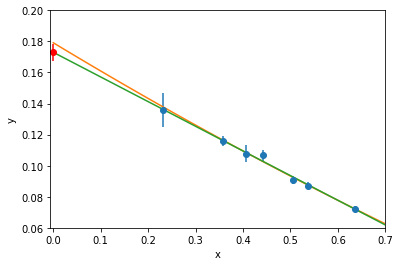

In [21]:
def chisq2(params):
    a, b, c = params
    return np.sum( (a + b*x + c*x*x - y)**2/sigmay**2 )

initial_guess = [0.2, -1, 0]
minimize(chisq2, initial_guess)

dof = len(myData) - 3
chisq_min2 = minimize(chisq2, initial_guess).fun

print("chisq_min/dof = ", chisq_min2/dof)
print("Q = ", gammaincc(dof/2, chisq_min2/2))

plt.errorbar(x, y, xerr = sigmax, yerr = sigmay, fmt='o')
plt.errorbar(0, best_fit[0], yerr=error_on_a, fmt='ro')

best_fit_quad = minimize(chisq2, initial_guess).x
plt.plot(x_for_plot, best_fit_quad[0] + best_fit_quad[1]*x_for_plot + best_fit_quad[2]*x_for_plot*x_for_plot)
plt.plot(x_for_plot, best_fit_withxerrors[0] + best_fit_withxerrors[1]*x_for_plot)

plt.xlabel("x")
plt.ylabel("y")
plt.xlim(-0.006, 0.7)
plt.ylim(0.06, 0.2)

plt.show()

Good practice:

- when fitting a polynomial

  => use the lowest order that fits your data (good $\chi^2$)...
  
  => ...and is consistent with the next-highest order
  
  => this includes fitting to a constant (averaging the data)
  
  
- general fitting

  => use the simplest function that fits your data consistently
  
We want to assume as little as possible about the shape of the function!

- function should be maximally smooth (data permitting)
- function should have the least number of "features" (data permitting)

#### Meaningless fits

<img src="https://imgs.xkcd.com/comics/linear_regression.png" alt="Scientific Approach" style="width: 400px;"/>

Source [xkcd](https://xkcd.com/1725/)

#### Nonlinear least squares

Best fit parameters:  [2.58472177 1.37656197 0.50451671]
Errors on fit parameters:  [0.12111571 0.13616572 0.04997807]


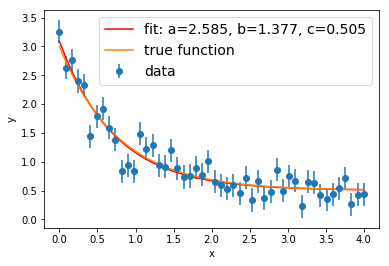

In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# our nonlinear example function (3 fit parameters)
def func(x, a, b, c):
    return a * np.exp(-b * x) + c

# produce some noisy data
xdata = np.linspace(0, 4, 50)

errY = 0.2
ydata = np.random.normal(func(xdata, 2.5, 1.3, 0.5),errY)
y_noise = errY*np.ones(len(xdata))
plt.errorbar(xdata, ydata, yerr = y_noise, fmt='o', label='data')

# do the nonlinear fit (to the true function) using scipy.optimize.curve_fit
popt, pcov = curve_fit(func, xdata, ydata, sigma = y_noise, absolute_sigma=True)
print("Best fit parameters: ", popt)
print("Errors on fit parameters: ", np.sqrt(np.diag(pcov)))

plt.plot(xdata, func(xdata, *popt), 'r-', label='fit: a=%5.3f, b=%5.3f, c=%5.3f' % tuple(popt))
plt.plot(xdata, func(xdata, 2.5, 1.3, 0.5), label='true function')

plt.xlabel('x')
plt.ylabel('y')
plt.legend(fontsize = 14)
plt.show()

Problems with least square fitting:

- probability $Q$ doesn't tell you if your data is actually Gaussian
- real data is usually not Gaussian
- outliers are much more common (long tails)
- sometimes these deviations are due to not having enough data points
- but often there are additional errors which are harder to quantify

=> need **robust estimation**

For example minimize $\sum_{i=1}^N|y_i - a - bx_i|$ (assuming all $\sigma_i$ the same)

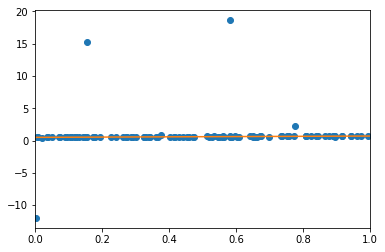

In [56]:
def f(x):
    return 0.5 + 0.2*x

num_points = 100
x = np.sort(np.random.rand(num_points))
errY = 0.02
y = np.random.normal(f(x),errY)
x_for_plot = np.linspace(0, 1, num_points)

# outliers
y[::20] = np.random.normal(f(x[::20]),1000*errY)

plt.xlim(0, 1)
plt.plot(x,y,"o")
plt.plot(x_for_plot,f(x_for_plot))
plt.show()

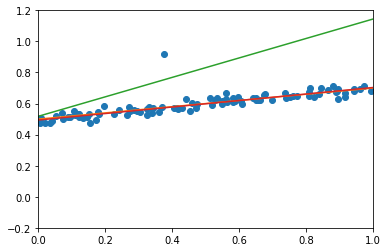

In [59]:
def chisq(params):
    a, b = params
    return np.sum( (a + b*x - y)**2/errY**2 )

def robust(params):
    a, b = params
    return np.sum( abs(a + b*x - y))

initial_guess = [0.5, 0.2]
best_chisq = minimize(chisq, initial_guess).x
best_robust = minimize(robust, initial_guess).x

plt.xlim(0, 1)
plt.ylim(-0.2, 1.2)
plt.plot(x,y,"o")
plt.plot(x_for_plot,f(x_for_plot))
plt.plot(x_for_plot, best_chisq[0] + best_chisq[1]*x_for_plot)
plt.plot(x_for_plot, best_robust[0] + best_robust[1]*x_for_plot)
plt.show()

#### Correlated data

Unfortunately, most physical data is correlated...

... in particular for Monte Carlo simulations!<br><br>


![Autocorrelations](images/autocorr.png)

<br>

Autocorrelations: $N$ **successively** taken data points give us **less information** than $N$ independent data points

Strategy: **Blocking** / **Binning**

|--|--|--|--|--|--|--|--|--|--|--|--|--|--|--|--|--|--|--|--|--|--|--|--|--|--|--|--|--|--|--|--|--|--|--|--|--|--|--|--|--|--|--|--|--|--|--|--|

^ $\hspace{49mm}$ ^ $\hspace{49mm}$         ^ $\hspace{48mm}$         ^<br>
|----------------------------------------|---------------------------------------|---------------------------------------|

eventually the data points will become independent => autocorrelation length

- form **blocks** of $n$ **successive** data points and treat each block as **one data point**
- a block contains the **average** of the $n$ raw data points

Autocorrelated data:

- $n$ points contain essentially the same information as 1 data point
- binning $n$ points together doesn't increase the accuracy
- but it decreases the total number of data points!

  => error will go up

Independent data:

- $n$ points contain more information than 1 data point
- binning them together gives a more precise data point
- this offsets the fact that the total number of data points decreased

  => error will stay constant

=> Block data until the error stops increasing with increasing block size!

<br>

![Blocking error analysis](images/blocking.png)


#### Jackknife and Bootstrap

Great methods to deal with "badly-behaved" data/models through [resampling](https://en.wikipedia.org/wiki/Resampling_(statistics))

- correlated data
- very non-Gaussian data
- model too complicated to make proper error analysis possible/feasible

See for example "Numerical Recipes" or *[Everything you wanted to know about Data Analysis and Fitting but were afraid to ask](https://arxiv.org/pdf/1210.3781.pdf)* by Peter Young for more information